In [9]:
import numpy as np
import random
from math import sqrt
import matplotlib.pyplot as plt
import cv2
try:
  from google.colab.patches import cv2_imshow
except:
  pass
from google.colab import drive
from tqdm import tqdm

In [10]:
# Get images to the same pwd
drive.mount('/content/drive/')
!unzip "/content/drive/My Drive/AA_Assignment_CS519_CS421/images" -d "/content/"

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
Archive:  /content/drive/My Drive/AA_Assignment_CS519_CS421/images.zip
replace /content/cat.tif? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [15]:
## 1-d DFT
def DFT(x):
    x = np.asarray(x, dtype=float)
    N = len(x)
    M = np.ones((len(x), len(x)), dtype=complex)
    w = np.exp((2*np.pi*1J)/N)
    for i in range(N):
        for j in range(N):
            M[i][j] = np.power(w, i*j)
    return np.dot(M,x)

In [16]:
# 1-D FFT
def double_db(x):
  return np.pad(x, (0, x.shape[0]), 'constant')

def FFT(x):
    n = len(x)
    if n==1:
        return x
    wn = np.exp(2*np.pi*1J/n)
    w = 1
    even = FFT(x[::2])
    odd = FFT(x[1::2])
    y = np.zeros_like(x, dtype=complex)
    for k in range(n//2):
        y[k] = even[k] + w*odd[k]
        y[k+(n//2)] = even[k] - w*odd[k]
        w = w*wn
    return y

In [17]:
# Make sure FFT and DFT have same value
# testcases
failure = 0
j = 0
max_iters = 1000
n = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048]
for i in tqdm (range (max_iters), desc="Loading..."):
    x = np.random.rand(n[j%len(n)])
    x1 = double_db(x)

    m1 = DFT(x1)
    m3 = FFT(x1)

    if(np.allclose(m1, m3) == False):
        print(False)
        failure = failure+1

print("Failed",failure,"times!")

Loading...: 100%|██████████| 1000/1000 [00:00<00:00, 2079.27it/s]

Failed 0 times!


In [18]:
import math
def rifft(y):
    n = y.size
    if n == 1:
        return y
    i = 1j
    w_n = np.exp(- 2 * i * np.pi / float(n))
    w = 1
    a_0 = rifft(y[::2])
    a_1 = rifft(y[1::2])
    a = np.zeros(n, dtype=np.complex_)
    for k in range(0, n // 2):
        a[k] = (a_0[k] + w * a_1[k])
        a[k + n // 2] = (a_0[k] - w * a_1[k])
        w = w * w_n
    return a

def IFFT(x):
    return rifft(x)/len(x)

In [19]:
# Testing our functions with numpy's
failure = 0
n = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048]
for i in tqdm (range (1000), desc="Loading..."):
    x = double_db(np.random.rand(n[j%len(n)]))
    y = double_db(np.random.rand(n[j%len(n)]))

    m1 = FFT(x)
    m2 = FFT(y)
    c = m1*m2

    CRc = IFFT(c)
    v = np.fft.ifft(np.fft.fft(x)*np.fft.fft(y))
    if(np.allclose(CRc, v) == False):
        failure = failure+1

print("Failed",failure,"times!")

Loading...: 100%|██████████| 1000/1000 [00:00<00:00, 1868.62it/s]

Failed 0 times!


In [20]:
# Multiplication using convolution for loop
def convolution(x, y):
  ck = np.zeros(y.shape[0] + x.shape[0])
  x = double_db(x)
  y = double_db(y)

  for i in range(ck.shape[0]):
      for j in range(0, i+1):
          ck[i] += x[j]*y[i-j]

  return ck

In [21]:
# Verifying FFT-IFFT multiplication with regards to convolution loop multiplication
failure = 0
j = 0
max_iters = 10000
n = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048]
for i in tqdm (range (max_iters), desc="Loading..."):
    x = np.random.rand(n[j%len(n)])
    y = np.random.rand(n[j%len(n)])
    x1 = double_db(x)
    y1 = double_db(y)

    m1 = FFT(x1)
    m2 = FFT(y1)

    Cx = IFFT(m1*m2)
    Cx1 = convolution(x, y)

    if(np.allclose(Cx1, Cx) == False):
        failure = failure+1

print("Failed",failure,"times!")

Loading...: 100%|██████████| 10000/10000 [00:06<00:00, 1530.96it/s]

Failed 0 times!


In [22]:
# Time complexity comparision of FFT, DFT, np.fft.fft
import time
fft = {4:0, 8:0, 16: 0, 32:0, 64: 0, 128: 0, 256: 0, 512: 0, 1024: 0, 2048: 0}
dft = {4:0, 8:0, 16: 0, 32:0, 64: 0, 128: 0, 256: 0, 512: 0, 1024: 0, 2048: 0}
nps = {4:0, 8:0, 16: 0, 32:0, 64: 0, 128: 0, 256: 0, 512: 0, 1024: 0, 2048: 0}
n = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048]
max_iters = 1
for i in range(max_iters):
  for i in n:
    x = np.random.rand(i)
    y = double_db(x)
    start = time.time()
    c1 = DFT(y)
    end = time.time()
    dft[i]+=(end - start)
    start = time.time()
    c2 = FFT(y)
    end = time.time()
    fft[i]+=(end - start)
    start = time.time()
    c3 = np.fft.fft(y)
    end = time.time()
    nps[i]+=(end - start)

# Find average over max_iters
fft = {i: (fft[i]/max_iters) for i in fft}
dft = {i: (dft[i]/max_iters) for i in dft}
nps = {i: (nps[i]/max_iters) for i in nps}

{4: 5.936622619628906e-05,
 8: 2.8133392333984375e-05,
 16: 8.916854858398438e-05,
 32: 4.38690185546875e-05,
 64: 4.267692565917969e-05,
 128: 9.584426879882812e-05,
 256: 7.557868957519531e-05,
 512: 8.988380432128906e-05,
 1024: 0.000133514404296875,
 2048: 0.00016736984252929688}

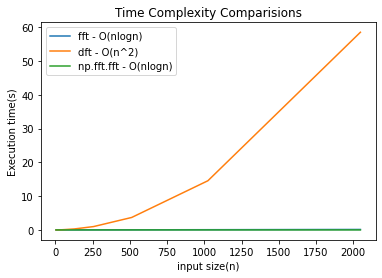

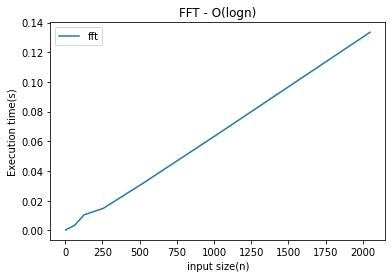

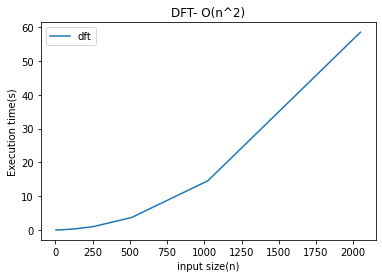

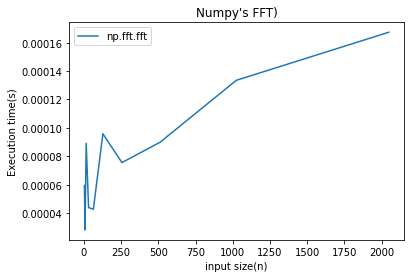

In [23]:
# n vs time plots
plt.figure()
plt.plot(list(fft.keys()), list(fft.values()), label = "fft - O(nlogn)") 
plt.plot(list(dft.keys()), list(dft.values()), label = "dft - O(n^2)") 
plt.plot(list(nps.keys()), list(nps.values()), label = "np.fft.fft - O(nlogn)") 
plt.xlabel("input size(n)") 
plt.ylabel("Execution time(s)")  
plt.title("Time Complexity Comparisions")
plt.legend()

plt.figure()
plt.plot(list(fft.keys()), list(fft.values()), label = "fft") 
plt.xlabel("input size(n)") 
plt.ylabel("Execution time(s)")  
plt.title("FFT - O(logn)")
plt.legend()

plt.figure()
plt.plot(list(dft.keys()), list(dft.values()), label = "dft") 
plt.xlabel("input size(n)") 
plt.ylabel("Execution time(s)")  
plt.title("DFT- O(n^2)")
plt.legend()

plt.figure()
plt.plot(list(nps.keys()), list(nps.values()), label = "np.fft.fft") 
plt.xlabel("input size(n)") 
plt.ylabel("Execution time(s)")  
plt.title("Numpy's FFT)")
plt.legend()

nps

In [24]:
# utils for RSA algo
def MODULAR_EXPONENTIATION(a, b, n):
  c = 0
  d = 1   
  binary = bin(b)[2:]
  for i in binary:
    c = 2*c
    d = (d*d) % n
    if(i == '1'):
      c+=1
      d = (d*a)%n
  return d

def EXTENDED_EUCLIDS_GCD(m, n):
  if(n == 0):
    return (m, 1, 0)
  else:
    d1, x1, y1 = EXTENDED_EUCLIDS_GCD(n, m%n)
    d, x, y = d1, y1, (x1 - (m//n)*y1)
    return (d, x, y)
    
def MODULAR_INVERSE(a, m):
  g, x, y = EXTENDED_EUCLIDS_GCD(a, m)
  if g != 1:
      return -1
  else:
      return x % m

def WITNESS(a, n):
  binary = bin(n-1)[2:]
  t = 0
  for i in binary[-1::-1]:
    if(i == '1'):
      break
    else:
      t+=1
  u = (n-1) >> t
  xcur = MODULAR_EXPONENTIATION(a, u, n)
  for i in range(t):
    xprev = xcur 
    xcur = (xprev*xprev) % n
    if(xcur == 1 and xprev != 1 and xprev != n-1):
      return 1
  if(xcur != 1):
    return 1
  return 0

# Fermat's little theorem
def FERMATS_TEST(n):
  if(MODULAR_EXPONENTIATION(2, n - 1, n) != 1 % n):
    return 0
  return 1

def MILLER_RABIN_TEST(n, s):
  for i in range(s):
    a = random.randint(1, n-1)
    if(WITNESS(a, n)):
      return 0
  return 1

def BRUTEFORCE_TEST(n):
  if(n > 1):
      for i in range(2, int(sqrt(n)) + 1):
          if (n % i == 0):
              return 0
      return 1
  else:
      return 0
    
def EUCLIDS_GCD(m, n):
  if(n == 0):
    return m
  return EUCLIDS_GCD(n, m%n)

In [25]:
# RSA Encryption
class Transmission:
  def __init__(self, bits):
    s = random.randint(5,20)  # iters in miller rabin
    while(1):
      p = random.getrandbits(bits)
      if(p <= 1):
        continue
      if(p%2 == 0):
        p+=1
      if(not FERMATS_TEST(p)):
        # print("Failed fermat's little theorem test for p = ", p)
        continue
      if(not MILLER_RABIN_TEST(p, s)):
        # print("Failed miller rabin test for p = ", p)
        continue
      # if(not BRUTEFORCE_TEST(p)):
        # print("Failed Bruteforce for p = ", p)
        # continue
      break
      
    while(1):
      q = random.getrandbits(bits)
      if(q <= 1):
        continue
      if(p == q):
        continue
      if(q%2 == 0):
        q+=1
      if(not FERMATS_TEST(q)):
        # print("Failed fermat's little theorem test for q = ",q)
        continue
      if(not MILLER_RABIN_TEST(q, s)):
        # print("Failed miller rabin test for q = ", q)
        continue
      # if(not BRUTEFORCE_TEST(q)):
        # print("Failed Bruteforce for q = ", q)
        # continue
      break
    n = p*q
    x = random.randint(1, 10)
    e = 3
    while(EUCLIDS_GCD(e, (p-1)*(q-1)) != 1):
      e+=2

    d = MODULAR_INVERSE(e, (p-1)*(q-1))
    self.P = (e, n)
    self.S = (d, n)

  def encrypt(self, Preciever, M):
    e = Preciever[0]
    n = Preciever[1]
    return MODULAR_EXPONENTIATION(M, e, n)
  
  def decrypt(self, C):
    d = self.S[0]
    n = self.S[1]
    return MODULAR_EXPONENTIATION(C, d, n)

  def encrypt_c(self, Preceiver, M):
    e = Preceiver[0]
    n = Preceiver[1]
    cipher = [MODULAR_EXPONENTIATION(ord(chr), e, n) for chr in M]
    return cipher

  def decrypt_c(self, C):
    d = self.S[0]
    n = self.S[1]
    aux = [chr(MODULAR_EXPONENTIATION(x, d, n)) for x in C]
    return ''.join(aux)


In [26]:
# encrypting C(X) using 512 bit keys

sender = Transmission(512)
receiver = Transmission(512)

x = np.random.rand(512)
y = np.random.rand(512)
x1 = double_db(x)
y1 = double_db(y)

m1 = FFT(x1)
m2 = FFT(y1)

Cx = m1*m2
CRc = IFFT(Cx)
V = np.array([str(x) for x in Cx])
C = np.array([sender.encrypt_c(receiver.P, x) for x in V])
M = np.array([complex(receiver.decrypt_c(x)) for x in C])
np.allclose(M, Cx)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


True

In [27]:
# Testcases for RSA Encryption
bits = [128, 256, 512]
failure = 0

for bit in bits:
  sender = Transmission(bit)
  reciever = Transmission(bit)  
  for i in range(1000):
    M = random.randint(-100000000, 100000000)
    C = sender.encrypt(reciever.P, M)
    M1 = reciever.decrypt(C)
    if(M < 0):
      M1 = M1 - reciever.P[1]
    if(M1 != M):
      failure+=1

print("Failed",failure,"times!")

Failed 0 times!


In [28]:
# 2D FFT
def FFT2D(matrix):
  matrix = np.apply_along_axis(FFT, 1, matrix)
  matrix = np.apply_along_axis(FFT, 0, matrix)

  return matrix

In [29]:
# 2D IFFT
def IFFT2D(matrix):
  matrix = np.apply_along_axis(IFFT, 1, matrix)
  matrix = np.apply_along_axis(IFFT, 0, matrix)

  return matrix

In [30]:
# testing 2D-fft and 2D-ifft using a random grayscale image
grayscale_img = np.random.randint(0, 256, size = (4,4))
ffted = FFT2D(grayscale_img)
iffted = IFFT2D(ffted)
np.allclose(iffted, grayscale_img)

True

In [31]:
# Lossy compression -> apply fft2d, drop some values, apply ifft2d
def compression(image, threshold = 0.5):
  img_fft = FFT2D(image)
  img_fft_sorted = np.sort(np.abs(img_fft.reshape(1, img_fft.shape[0]*img_fft.shape[1])[0]))
  upper_bound = img_fft_sorted[int(threshold*(len(img_fft_sorted) - 1))]
  compressed = img_fft *( np.abs(img_fft) >= upper_bound )
      
  return np.real(IFFT2D(compressed)).astype('int')

Before compression: hd.tif


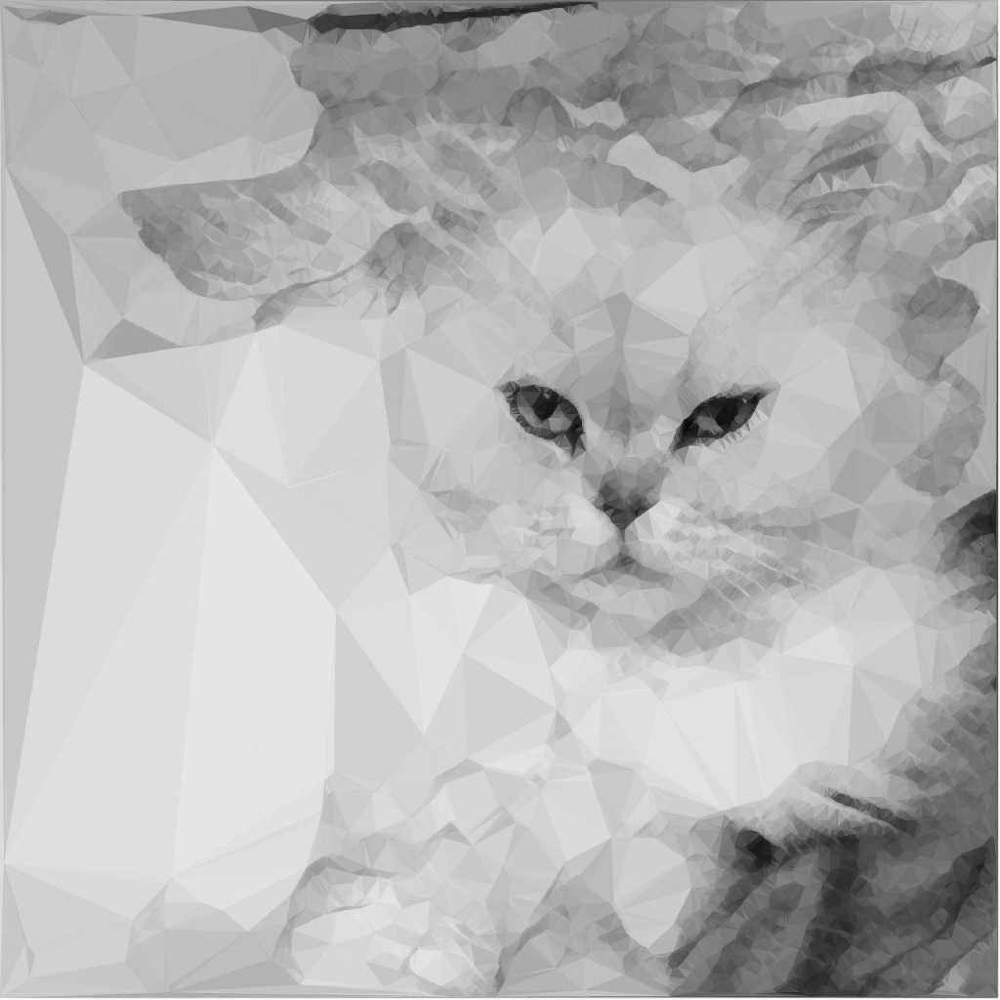

After compression at 0.1 threshold: hd.tif


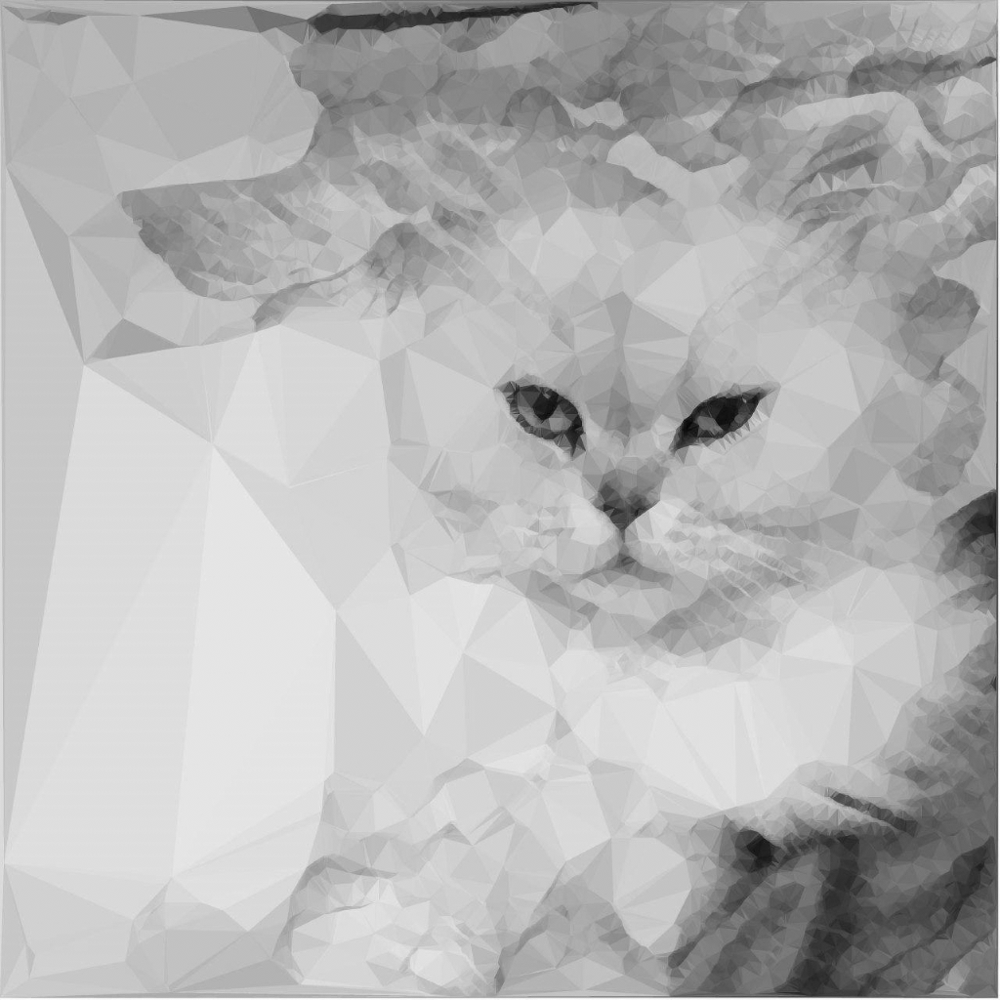

After compression at 0.5 threshold: hd.tif


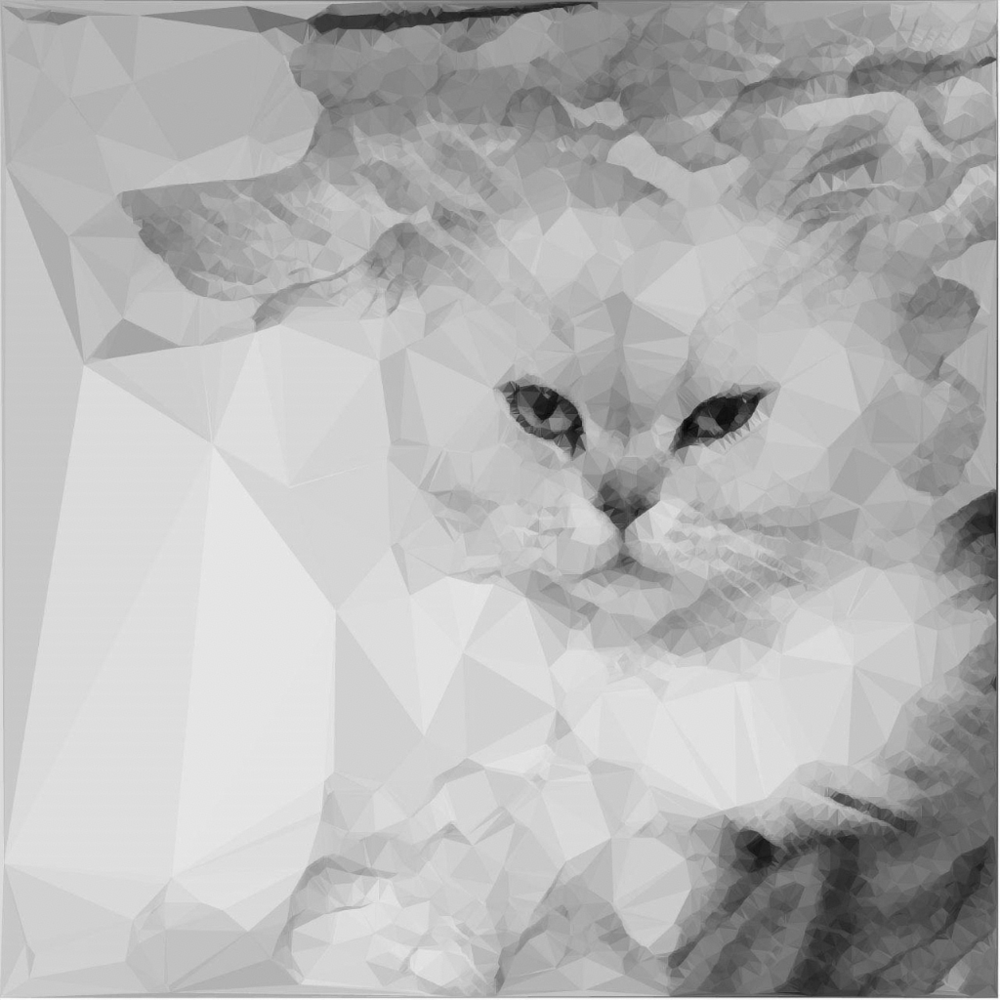

After compression at 0.8 threshold: hd.tif


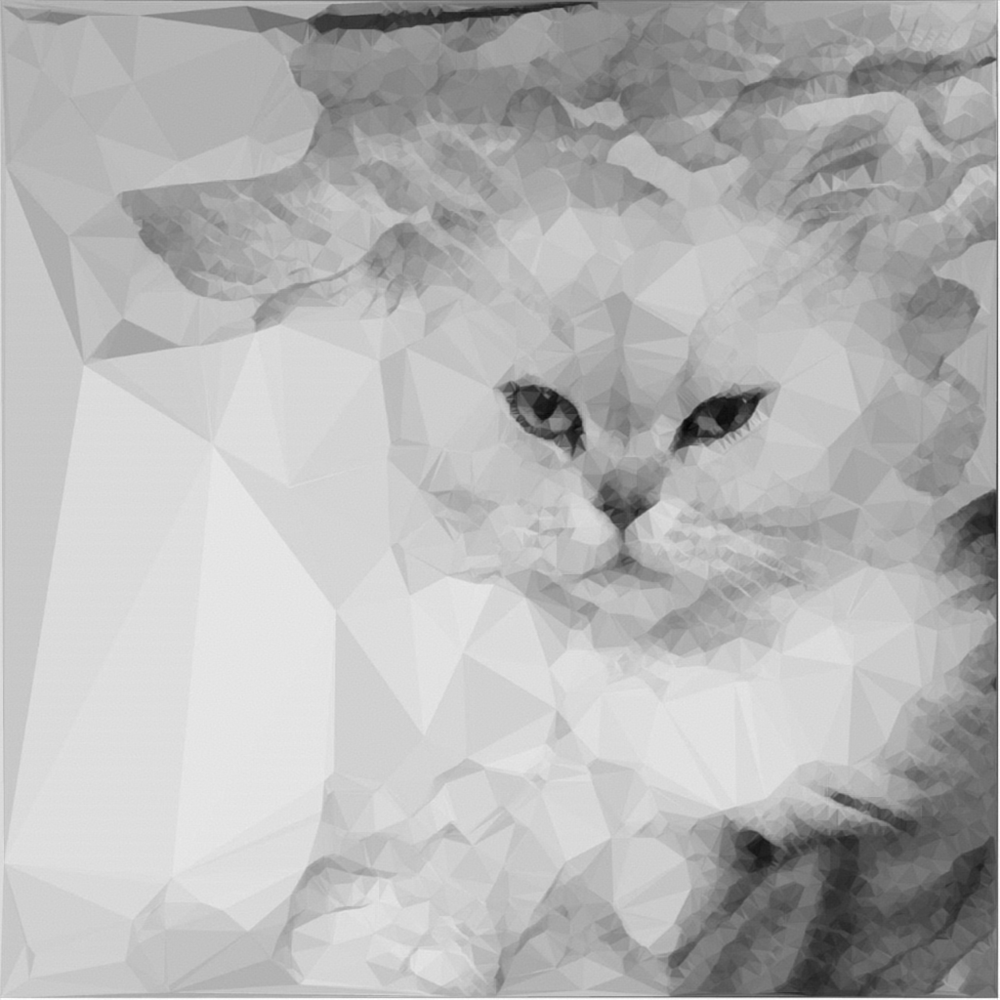

After compression at 0.9 threshold: hd.tif


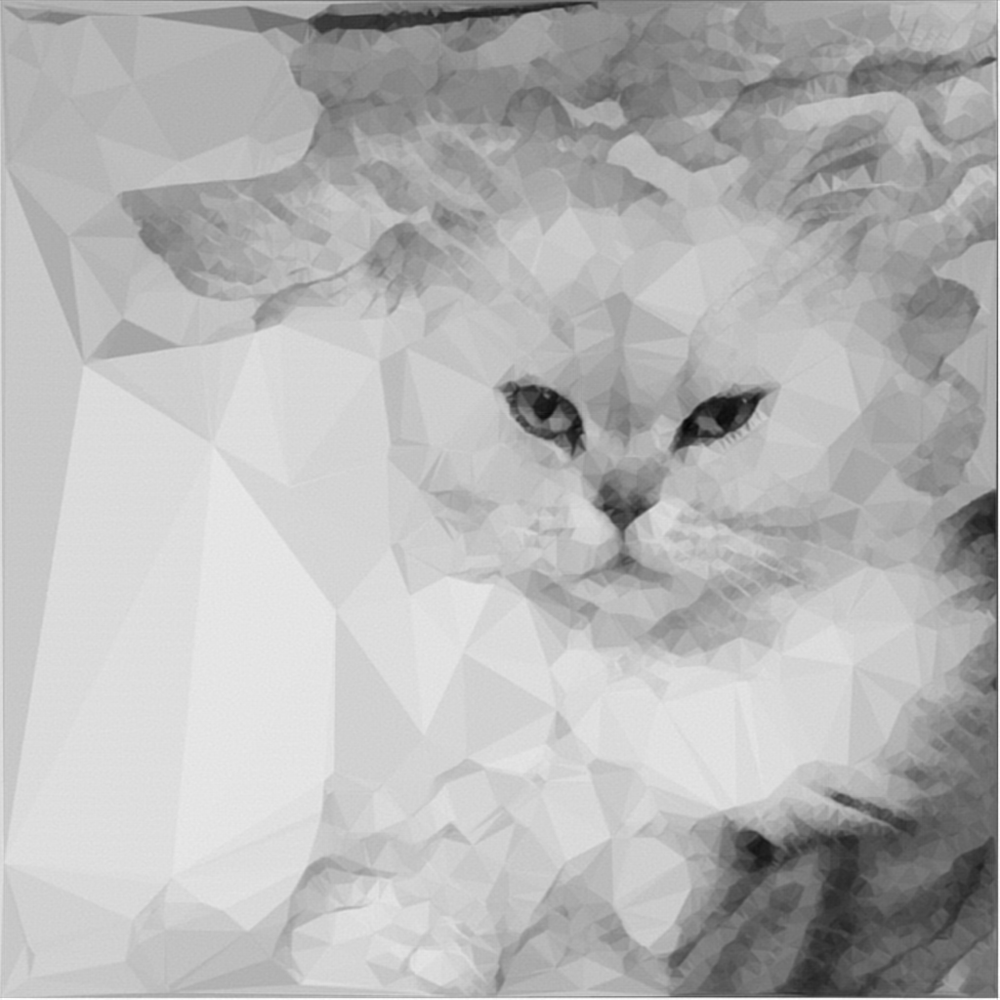

After compression at 0.95 threshold: hd.tif


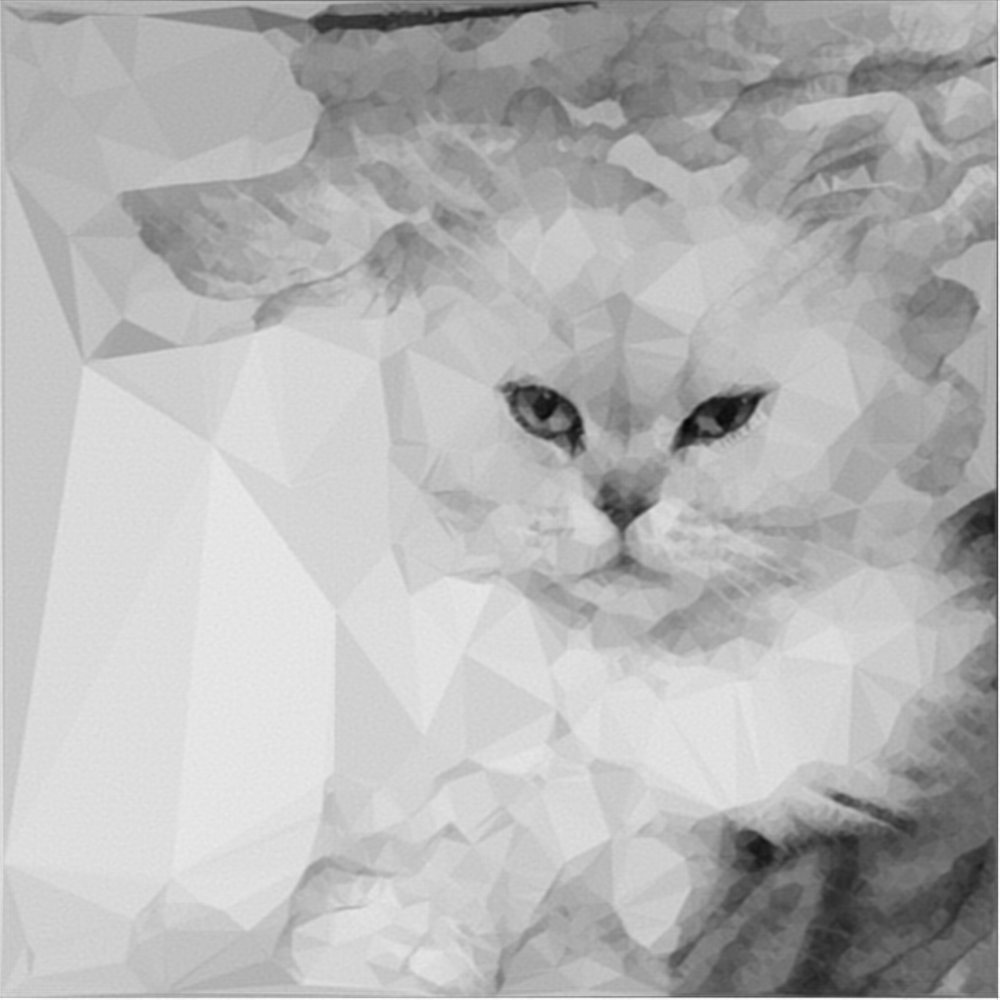

After compression at 0.99 threshold: hd.tif


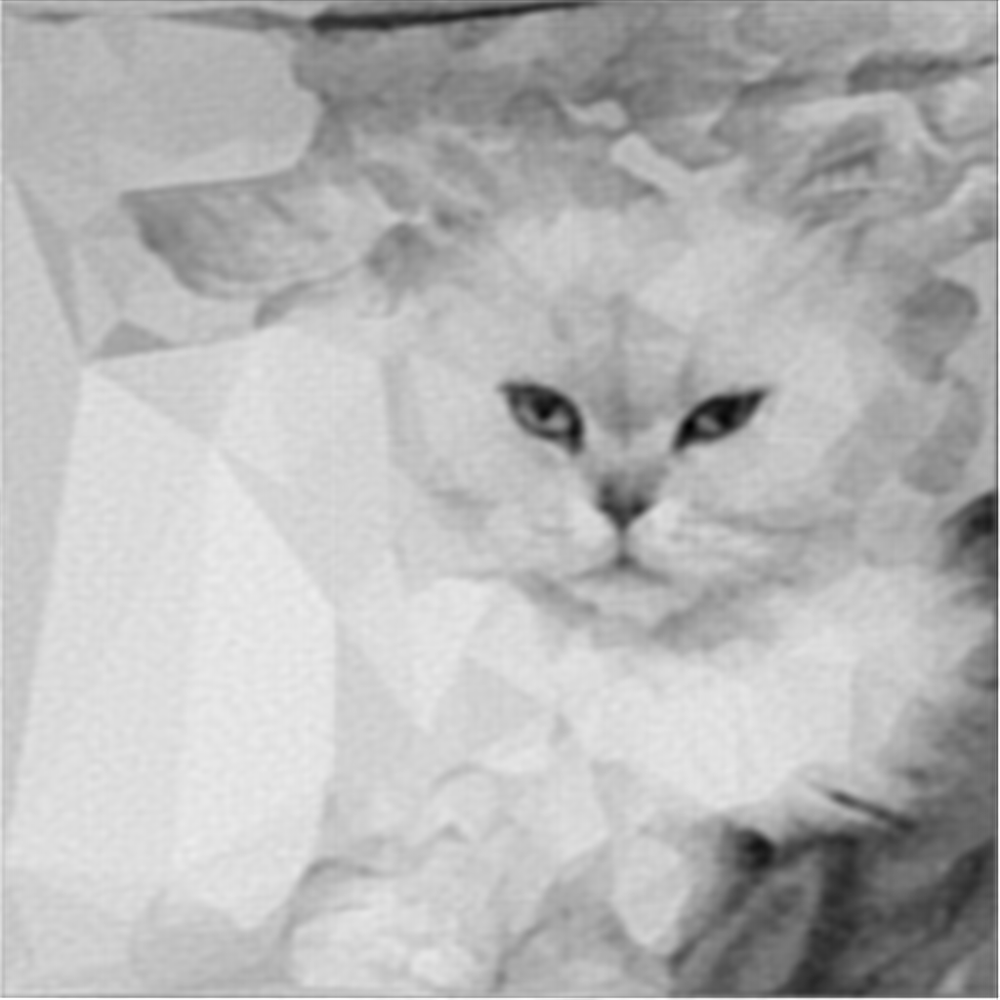

After compression at 0.999 threshold: hd.tif


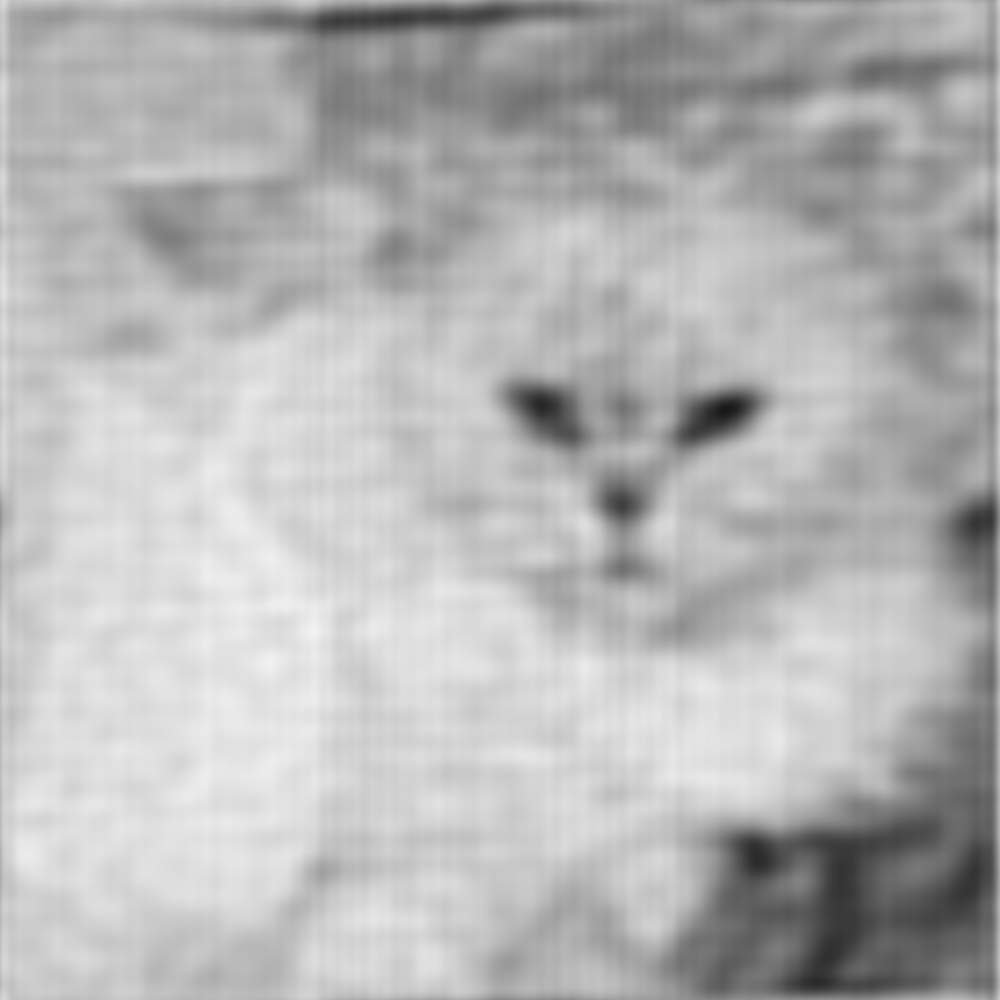

Before compression: cat.tif


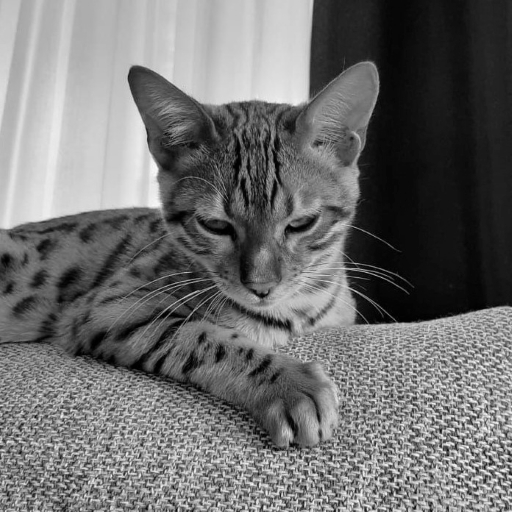

After compression at 0.1 threshold: cat.tif


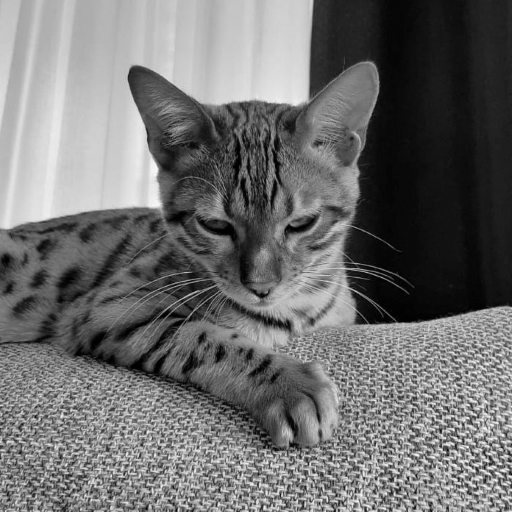

After compression at 0.5 threshold: cat.tif


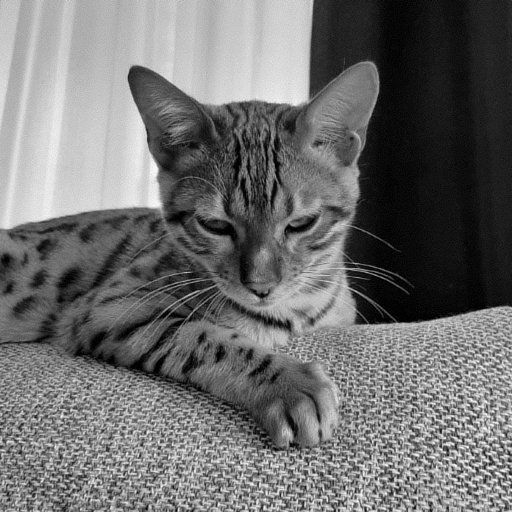

After compression at 0.8 threshold: cat.tif


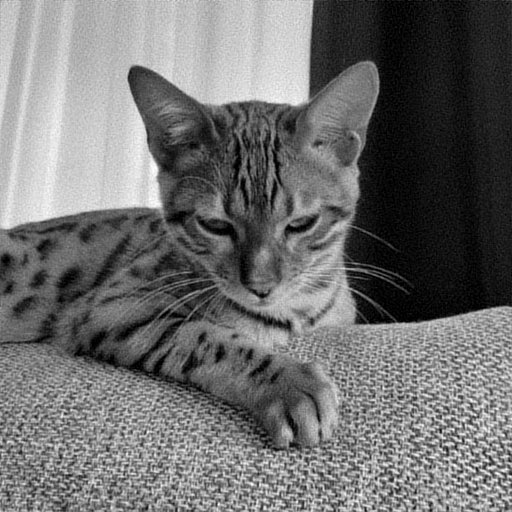

After compression at 0.9 threshold: cat.tif


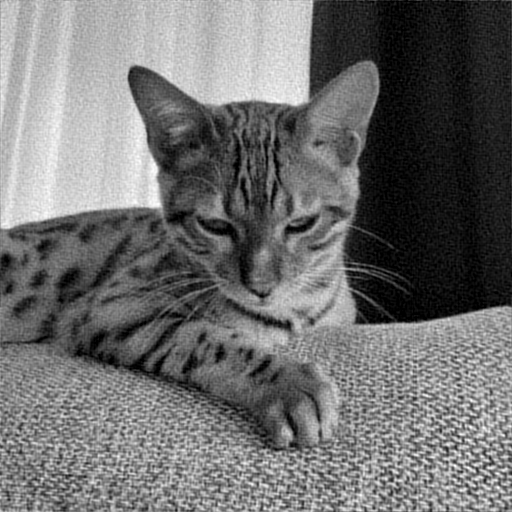

After compression at 0.95 threshold: cat.tif


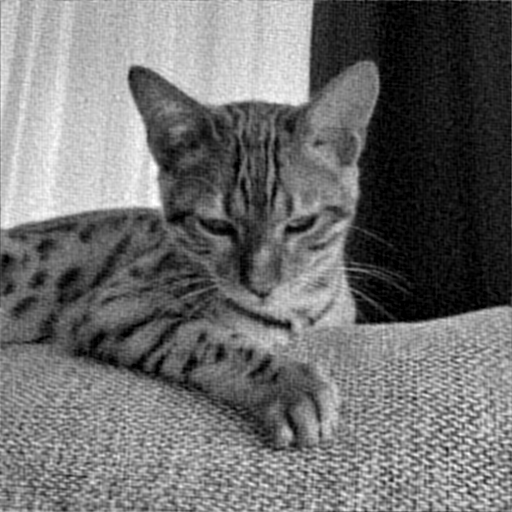

After compression at 0.99 threshold: cat.tif


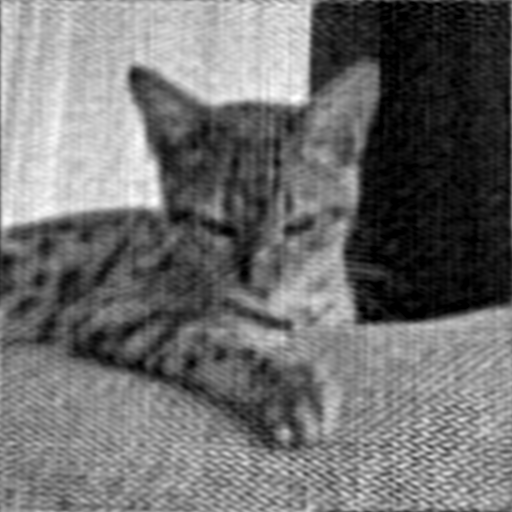

After compression at 0.999 threshold: cat.tif


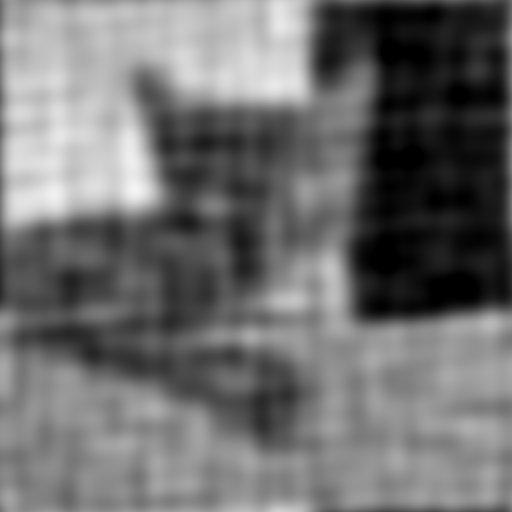

Before compression: tiger.tif


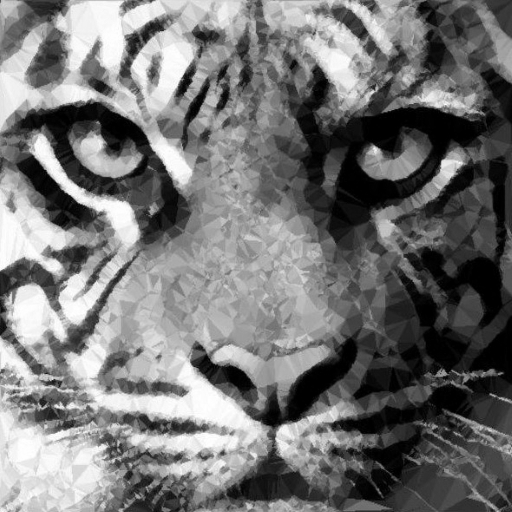

After compression at 0.1 threshold: tiger.tif


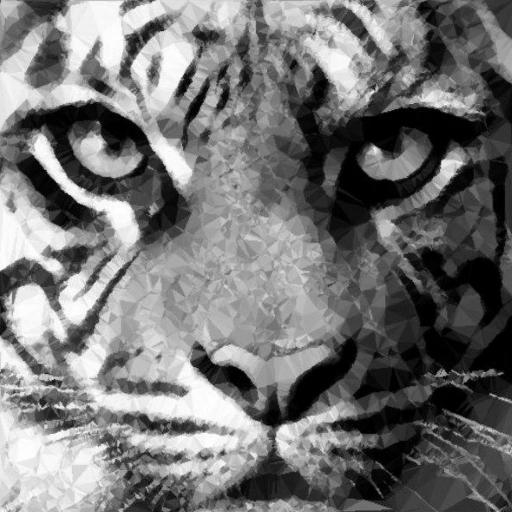

After compression at 0.5 threshold: tiger.tif


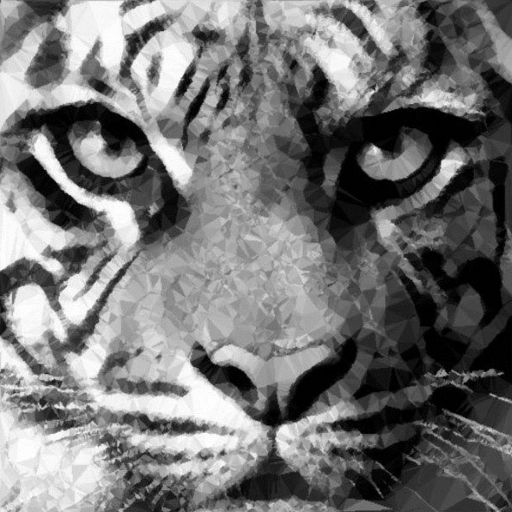

After compression at 0.8 threshold: tiger.tif


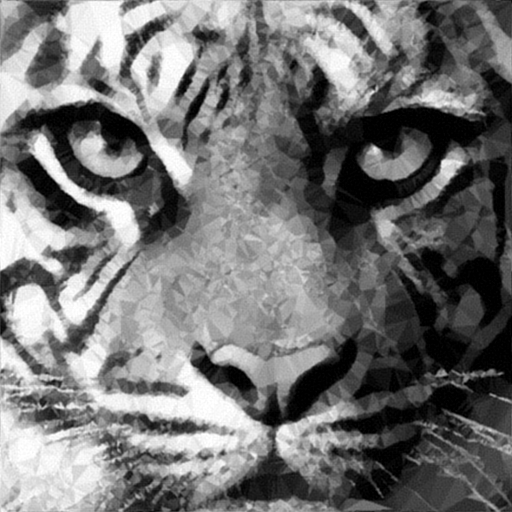

After compression at 0.9 threshold: tiger.tif


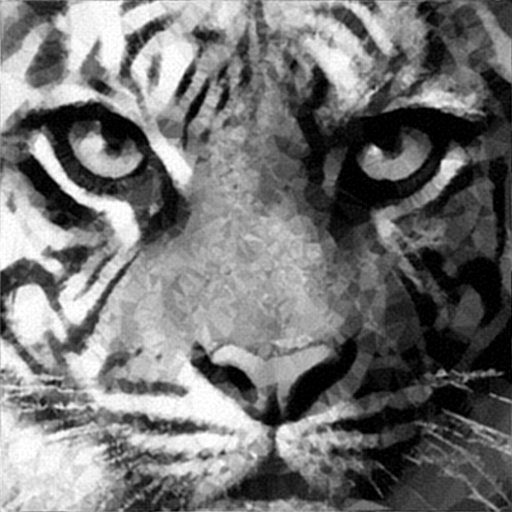

After compression at 0.95 threshold: tiger.tif


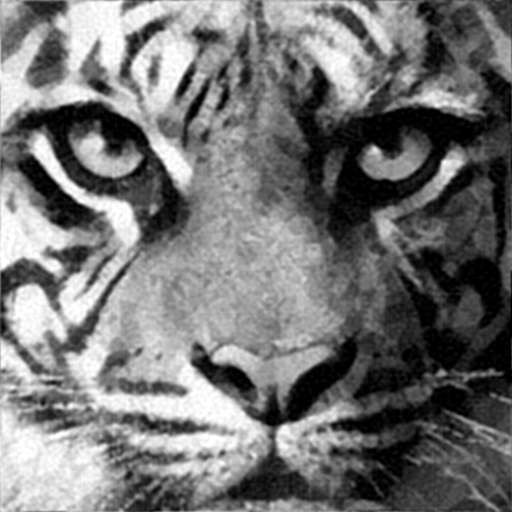

After compression at 0.99 threshold: tiger.tif


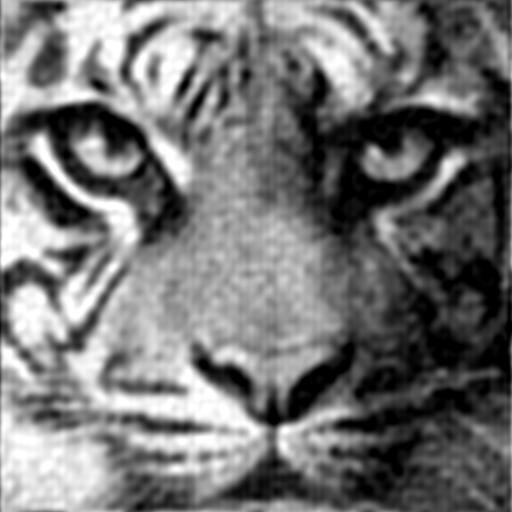

After compression at 0.999 threshold: tiger.tif


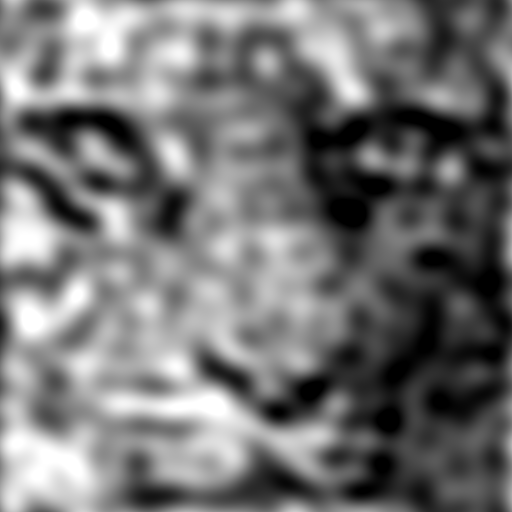

Before compression: scene.tif


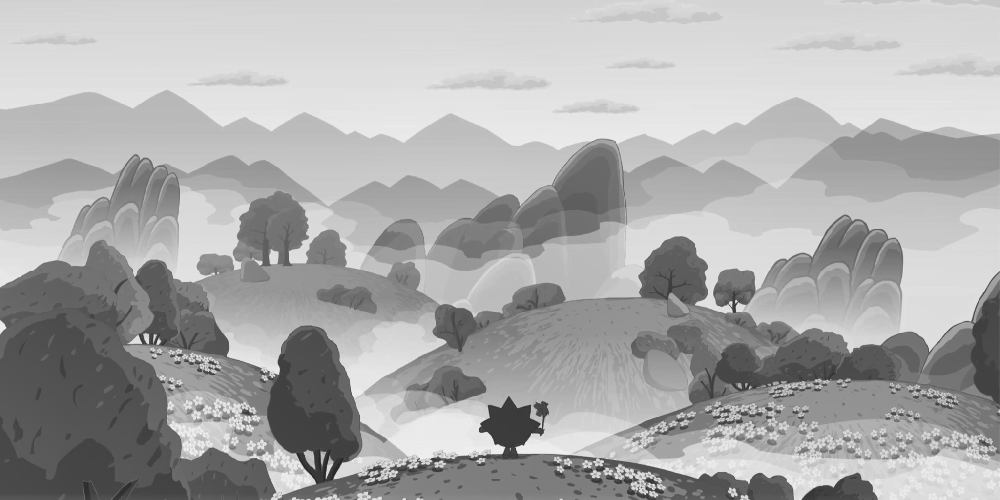

After compression at 0.1 threshold: scene.tif


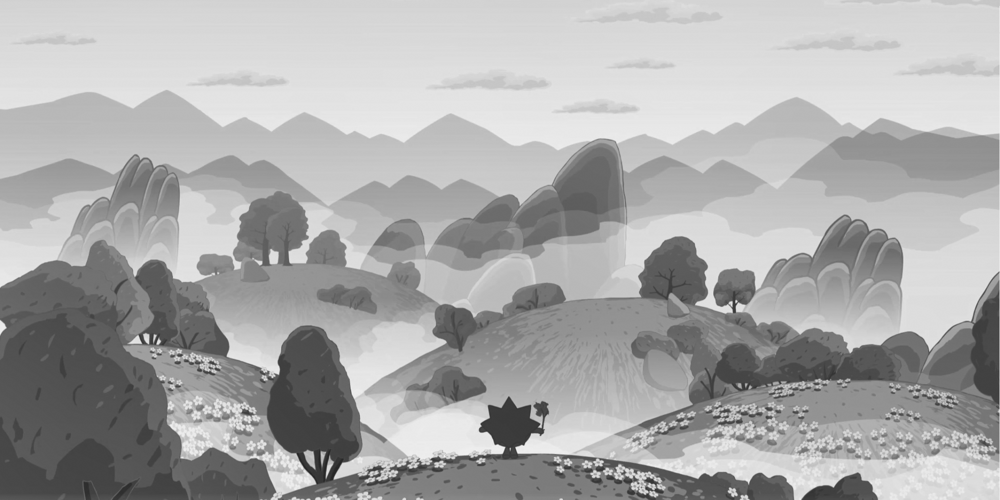

After compression at 0.5 threshold: scene.tif


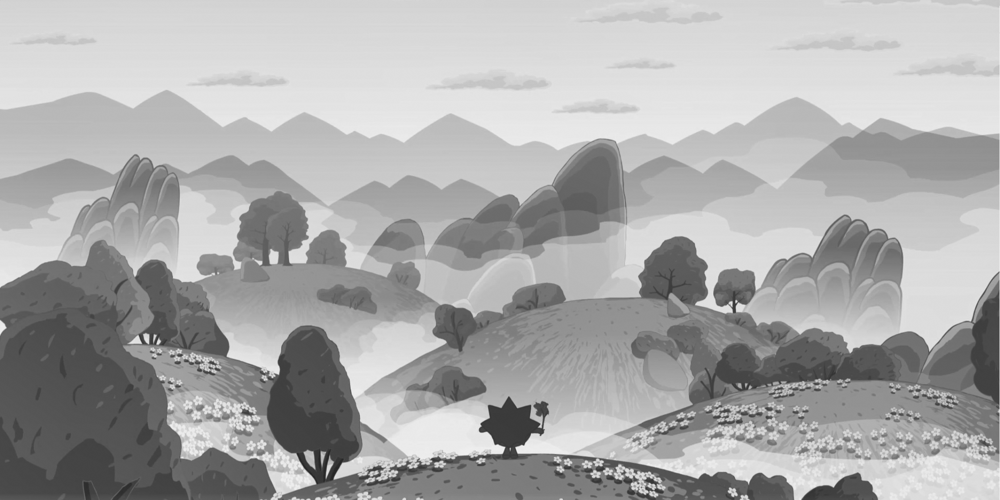

After compression at 0.8 threshold: scene.tif


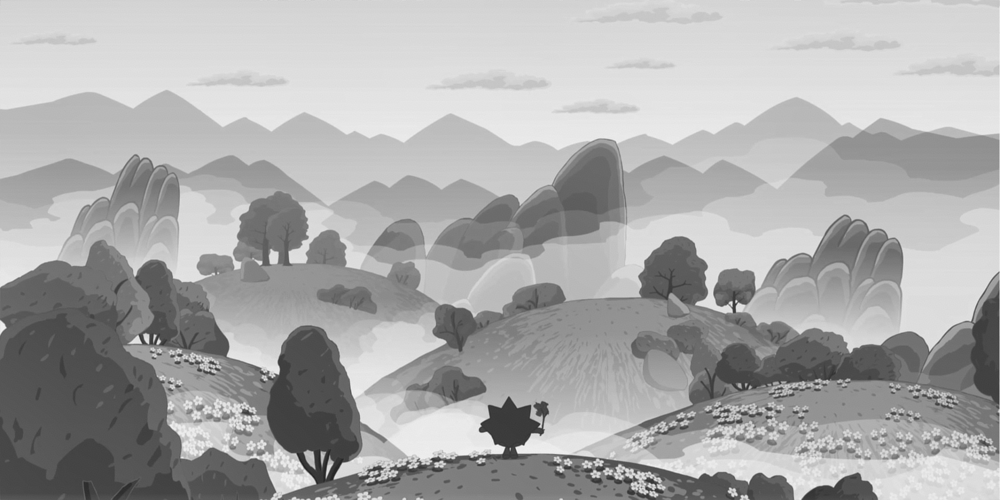

After compression at 0.9 threshold: scene.tif


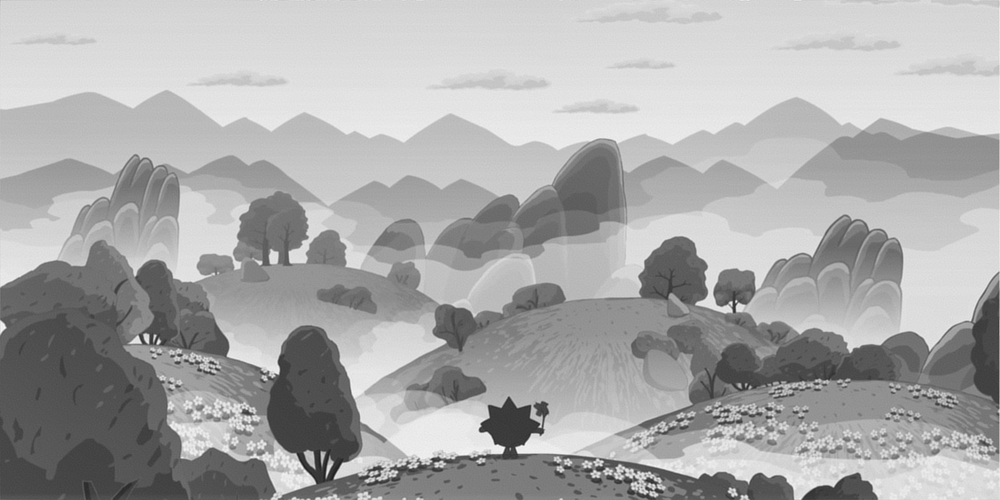

In [ ]:
# testcases for compression
thresh = [0.1, 0.5, 0.8, 0.9, 0.95, 0.99, 0.999]
imgs = ['hd', 'cat', 'tiger', 'scene']

for img in imgs:
  image = cv2.imread('{}.tif'.format(img),0)
  print("Before compression: {}.tif".format(img))
  try:
    cv2_imshow(image)
  except:
    cv2.imshow(image)
  for t in thresh:
    img_ifft = compression(image, t)
    print("After compression at {} threshold: {}.tif".format(t, img))
    try:
      cv2_imshow(img_ifft)
    except:
      cv2.imshow(img_ifft)
    cv2.imwrite('{}_compressed_{}.tif'.format(img, t), img_ifft)

In [ ]:
# View the decrease in file size
!ls -l